EDA

In [1]:
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport

In [2]:
df = pd.read_csv('DS_test_DAS.csv')
df

,Unnamed: 0,index,exp_no,time,depth,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,flow
0,0,0,33,2019-08-25 00:37:29.016,2767.515096,0.753388,-35.668176,-0.941335,-0.439364,0.550911,-285.039686,-0.990560,single phase
1,1,1,33,2019-08-25 00:37:29.016,2768.536031,0.696471,-35.657805,-1.056548,-0.435712,0.309469,-271.150071,-0.813306,single phase
2,2,2,33,2019-08-25 00:37:29.016,2769.557027,0.721337,-35.602885,-0.988542,-0.430664,0.336296,-281.951759,-0.863733,single phase
3,3,3,33,2019-08-25 00:37:29.016,2770.577963,0.847943,-35.613203,-0.784212,-0.439537,0.738699,-309.017401,-1.176452,single phase
4,4,4,33,2019-08-25 00:37:29.016,2771.598898,0.792865,-35.394236,-0.687367,-0.424627,0.591151,-274.285990,-1.232788,single phase
...,...,...,...,...,...,...,...,...,...,...,...,...,...
765097,765097,765097,6,2019-08-19 20:22:59.188,2788.955099,-2.123117,104.685462,1.550466,1.675385,-2.252495,679.704569,0.926924,slug
765098,765098,765098,6,2019-08-19 20:22:59.188,2789.976034,-1.793592,142.677140,1.273870,1.925686,-1.554997,669.346987,0.749850,slug
765099,765099,765099,6,2019-08-19 20:22:59.188,2790.997030,-1.437778,99.991947,1.265246,1.376899,-1.085527,575.896564,1.196033,slug
765100,765100,765100,6,2019-08-19 20:22:59.188,2792.017965,-0.587661,-15.612185,0.735824,-0.050144,-0.441683,355.367737,1.398159,slug


Since machine learning algorithms require numeric input and output, we will parse the time column so it can be used in the model.

In [3]:
#Parse time column
import datetime
df['time'] = pd.to_datetime(df['time'])
df['Dates'] = pd.to_datetime(df['time']).dt.date
df['Dates'] = pd.to_datetime(df['Dates'])
df['Hour'] = df['time'].dt.hour
df['Minutes'] = df['time'].dt.minute
df['Year'] = pd.to_datetime(df['time']).dt.year
df['Month'] = pd.to_datetime(df['time']).dt.month
df['Week'] = pd.to_datetime(df['time']).dt.week
df['Day'] = pd.to_datetime(df['time']).dt.day
df.drop(['Unnamed: 0', 'index'], axis = 1, inplace=True)
df

C:\Users\olowe_m\AppData\Local\Temp/ipykernel_20204/2296647557.py:10: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  df['Week'] = pd.to_datetime(df['time']).dt.week


,exp_no,time,depth,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,flow,Dates,Hour,Minutes,Year,Month,Week,Day
0,33,2019-08-25 00:37:29.016,2767.515096,0.753388,-35.668176,-0.941335,-0.439364,0.550911,-285.039686,-0.990560,single phase,2019-08-25,0,37,2019,8,34,25
1,33,2019-08-25 00:37:29.016,2768.536031,0.696471,-35.657805,-1.056548,-0.435712,0.309469,-271.150071,-0.813306,single phase,2019-08-25,0,37,2019,8,34,25
2,33,2019-08-25 00:37:29.016,2769.557027,0.721337,-35.602885,-0.988542,-0.430664,0.336296,-281.951759,-0.863733,single phase,2019-08-25,0,37,2019,8,34,25
3,33,2019-08-25 00:37:29.016,2770.577963,0.847943,-35.613203,-0.784212,-0.439537,0.738699,-309.017401,-1.176452,single phase,2019-08-25,0,37,2019,8,34,25
4,33,2019-08-25 00:37:29.016,2771.598898,0.792865,-35.394236,-0.687367,-0.424627,0.591151,-274.285990,-1.232788,single phase,2019-08-25,0,37,2019,8,34,25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
765097,6,2019-08-19 20:22:59.188,2788.955099,-2.123117,104.685462,1.550466,1.675385,-2.252495,679.704569,0.926924,slug,2019-08-19,20,22,2019,8,34,19
765098,6,2019-08-19 20:22:59.188,2789.976034,-1.793592,142.677140,1.273870,1.925686,-1.554997,669.346987,0.749850,slug,2019-08-19,20,22,2019,8,34,19
765099,6,2019-08-19 20:22:59.188,2790.997030,-1.437778,99.991947,1.265246,1.376899,-1.085527,575.896564,1.196033,slug,2019-08-19,20,22,2019,8,34,19
765100,6,2019-08-19 20:22:59.188,2792.017965,-0.587661,-15.612185,0.735824,-0.050144,-0.441683,355.367737,1.398159,slug,2019-08-19,20,22,2019,8,34,19


- As you can see above, we have 17 difference features which consist of the well depth, data and time of experiment, experiment features and flow types.
- In this excercise, we will seek to build a flow classifier model to predict the type of flow through the well based on the above features. Further analysis will need to be performed to identify the key features of interest for the model.

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 765102 entries, 0 to 765101
Data columns (total 18 columns):
 #   Column     Non-Null Count   Dtype         
---  ------     --------------   -----         
 0   exp_no     765102 non-null  int64         
 1   time       765102 non-null  datetime64[ns]
 2   depth      765102 non-null  float64       
 3   feature_0  765102 non-null  float64       
 4   feature_1  765102 non-null  float64       
 5   feature_2  765102 non-null  float64       
 6   feature_3  765102 non-null  float64       
 7   feature_4  765102 non-null  float64       
 8   feature_5  765102 non-null  float64       
 9   feature_6  765102 non-null  float64       
 10  flow       765102 non-null  object        
 11  Dates      765102 non-null  datetime64[ns]
 12  Hour       765102 non-null  int64         
 13  Minutes    765102 non-null  int64         
 14  Year       765102 non-null  int64         
 15  Month      765102 non-null  int64         
 16  Week       765102 no

- This shows that there are no null values within the dataset and a total number of 765102 records

In [5]:
#Perform initial EDA using Pandas profiling
profile = ProfileReport(df, title='Pandas Profiling Report')
profile

Render HTML: 100%|██████████| 1/1 [00:06<00:00,  6.21s/it]


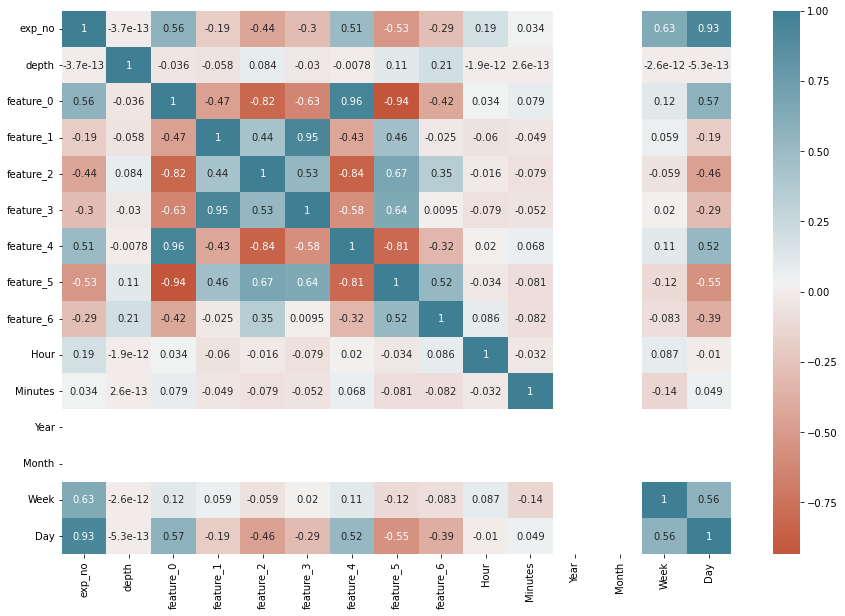

In [6]:
#Visualise heatmap
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

fig, ax = plt.subplots(figsize=(15,10))
sns.heatmap(df.corr(), annot=True, cmap=sns.diverging_palette(20, 220, n=256), mask = False)
plt.show()

**The following information can be observed from the above report:-**
1. No duplicates, null values or missing values within the dataset
2. The heatmap showed the correlation between the features and the flow type.
   1. Month, Year and Minutes showed low/0 correlation with the other variables and thus will not be used in model build.
   2. The target variable 'flow' is imbalanced which could sway the training of the model.
   3. Day and week of the experiment shows a high corrlation with the type of flow that was identified during the experiment
3. Feature_1, feature_2 and feature_3 showed a positive skewed histogram distubution which means that most of the values are clusteres around the left tail of the distribution. Whilst feature_4 showed a negatively skewed histogram distribution which means that most of the values are clustered around the right tail of the distribution.
4. Feature_5 and feature_6 exhibited a biomodal distibution which means that most of the values are clustered around the two obvious relative modes, or data peaks.
5. The depth variable showed a uniform distribution which meant the frequency of each class are consistent.

**Question 1**

a) From the data provided, we are unable to calculate the horizontal section.

In [8]:
#b) What types of flow have been observed? 
df['flow'].unique()

array(['single phase', 'slug', 'stratified'], dtype=object)

The pandas profile as well as the above command tells us that there are three types of flows identified during the experiment. Single-phase is the flow of a single phase i.e. gas or liquid or solid, and not a combination of the three. Slug flow is an aternating flow aof liquid and gas resulting in an unsteady behaviour of the fluid. This is a common occurence encountered within the oil industry and can cause undesired consequences. Startified flow is a multiphase flow regime where fluids separates into different layers where lighter fluids flow above heavier fluids. Developing a model to identify the types of flow can inform improving process operations and efficiency.

In [9]:
#c) How long is the longest experiment?
dx = df.copy()

In [10]:
series_1 = dx.groupby('exp_no')['time'].min() 
series_2 = dx.groupby('exp_no')['time'].max()

# converting from series to df so I can do a join on user
df_1 = pd.DataFrame(np.array([series_1]).transpose(), index=series_1.index, columns=['time_min']) 
df_2 = pd.DataFrame(np.array([series_2]).transpose(), index=series_2.index, columns=['time_max'])
df_1 = df_1.join(df_2)

In [11]:
df_1['duration'] = df_1['time_max'] - df_1['time_min']
df_1

,time_min,time_max,duration
exp_no,,,
0,2019-08-19 00:37:00.021,2019-08-19 00:41:55.021,0 days 00:04:55
1,2019-08-19 01:03:00.021,2019-08-19 01:07:55.021,0 days 00:04:55
2,2019-08-19 01:16:00.021,2019-08-19 01:20:55.021,0 days 00:04:55
3,2019-08-19 19:25:29.188,2019-08-19 19:30:59.188,0 days 00:05:30
4,2019-08-19 19:41:29.188,2019-08-19 19:46:59.188,0 days 00:05:30
5,2019-08-19 20:04:29.188,2019-08-19 20:08:59.188,0 days 00:04:30
6,2019-08-19 20:18:29.188,2019-08-19 20:22:59.188,0 days 00:04:30
7,2019-08-19 21:06:29.188,2019-08-19 21:10:59.188,0 days 00:04:30
8,2019-08-19 21:23:29.188,2019-08-19 21:27:59.188,0 days 00:04:30


In [12]:
df_1.iloc[df_1['duration'].idxmax()] 

time_min    2019-08-21 22:18:09.091000
time_max    2019-08-21 23:04:59.091000
duration               0 days 00:46:50
Name: 27, dtype: object

The longest experiement was 27 which took 46 minutes. During this experiment a single phase was observed.

**Question 2**

In [13]:
# to make plot interactive
%matplotlib inline
  
# importing required libraries
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import matplotlib.pyplot as plt
from pylab import *

dataset = df[['depth','time','feature_0','feature_1','feature_2','feature_3','feature_4','feature_5','feature_6']]
dataset['time'] = matplotlib.dates.date2num(dataset['time'])

C:\Users\olowe_m\AppData\Local\Temp/ipykernel_20204/1701688129.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['time'] = matplotlib.dates.date2num(dataset['time'])


In [14]:
#Reduce processing time for computing 3D plot
dataset = dataset.astype('float32')

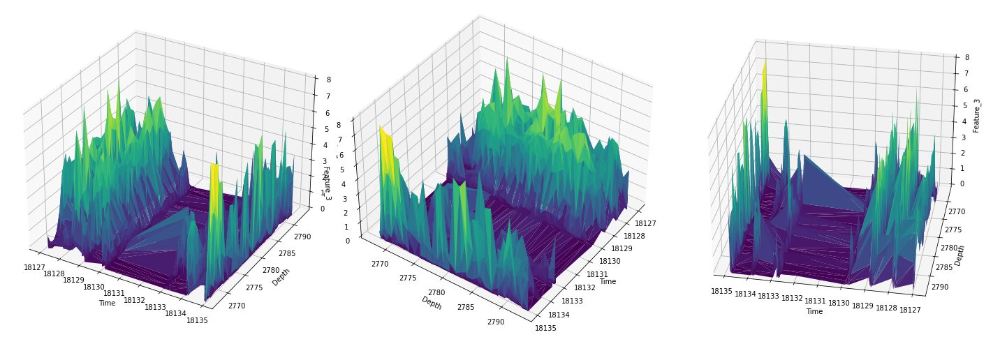

In [15]:
#Visualize a heatmap that shows the value of feature3 for each point in time and depth.

fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(131, projection='3d')
x = dataset['time']
y = dataset['depth']
z = dataset['feature_3']
surf1 = ax.plot_trisurf(x, y, z,
                cmap='viridis', edgecolor='none')
ax.set_xlabel('Time')
ax.set_ylabel('Depth')
ax.set_zlabel('Feature_3')
ax.set_zlim3d(0,8)

ax1 = fig.add_subplot(132,projection='3d')
surf2 = ax1.plot_trisurf(x, y, z, cmap='viridis',edgecolor='none')
ax1.set_xlabel('Time')
ax1.set_ylabel('Depth')
ax1.set_zlabel('Feature_3')
ax1.set_zlim3d(0,8)
ax1.view_init(40, 35)

ax2 = fig.add_subplot(133,projection='3d')
surf3 = ax2.plot_trisurf(x, y, z, cmap='viridis',edgecolor='none')
ax2.set_xlabel('Time')
ax2.set_ylabel('Depth')
ax2.set_zlabel('Feature_3')
ax2.set_zlim3d(0,8)
ax2.view_init(30, 100)

fig.subplots_adjust(wspace=0.5, hspace=0.2)
plt.tight_layout()
plt.show()

The above plots provide 3 different views of feature_3 performance during the trials. The following observations are as follows:-
1. Most of feature_3 reading activity were during the earlier trials of the experiement - this is shown by the consistency of feature_3 reading across the depth of the well. 
2. There is a period of low activity which could be due to various factors i.e. maintainence or equipment downtime.
3. Towards the latter end of the experiment, feature_3 readings were irregular across the depth of the well compared to the intial stages of the experiment. This is shown by the frequency of peaks and troughs observed with depth.

C:\Users\olowe_m\AppData\Local\Temp/ipykernel_20204/3381214596.py:6: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  dataset.hist(column=['depth','time','feature_0','feature_1','feature_2','feature_3','feature_4','feature_5','feature_6'], ax=ax, bins=10,density=True, histtype='bar');


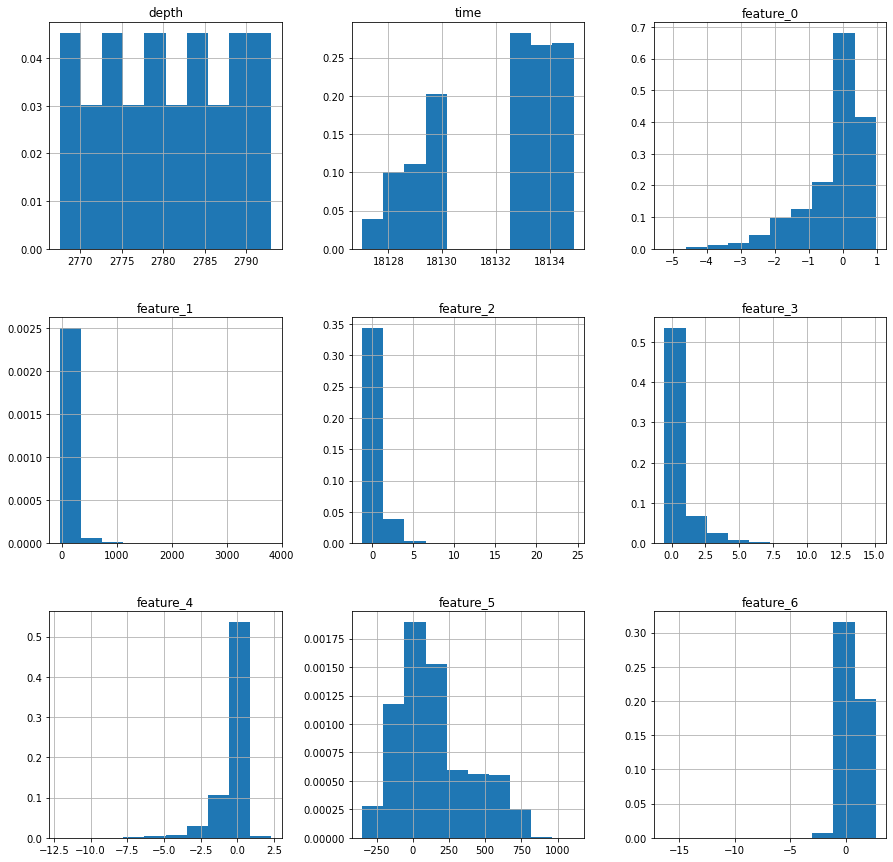

In [16]:
#Visualize feature distributions.
%matplotlib inline

fig = plt.figure(figsize = (15,15))
ax = fig.gca()
dataset.hist(column=['depth','time','feature_0','feature_1','feature_2','feature_3','feature_4','feature_5','feature_6'], ax=ax, bins=10,density=True, histtype='bar');

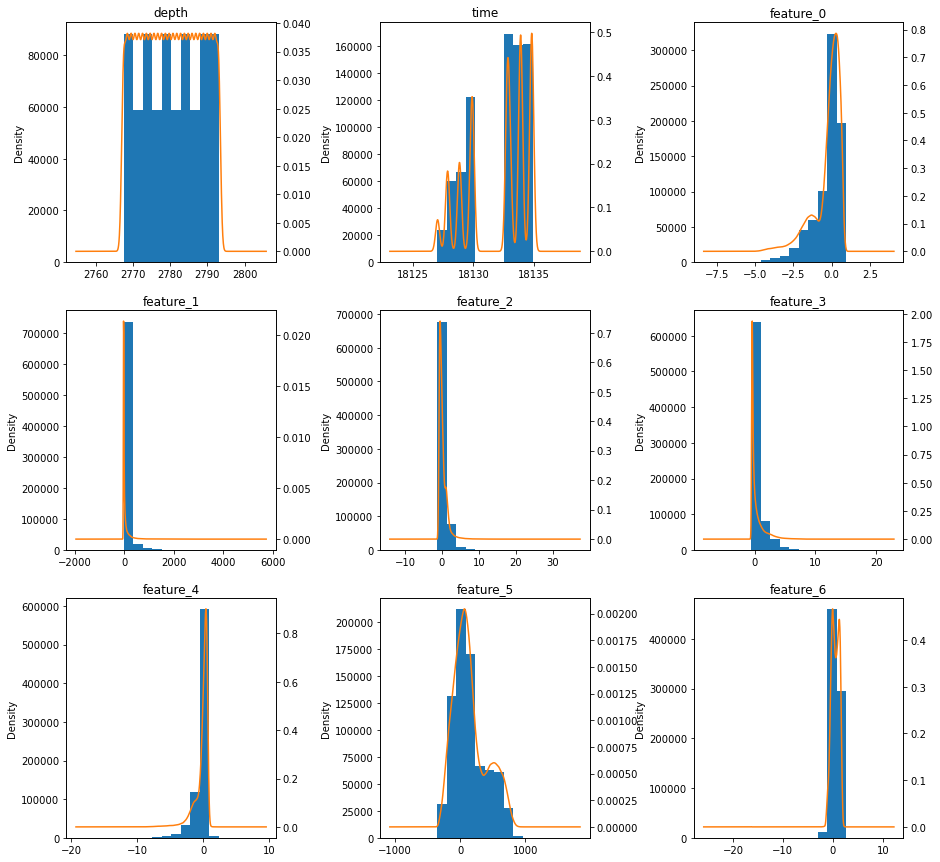

In [17]:
#Histogram and KDE plot
fig, ax = plt.subplots(3,3, figsize=(15, 15)) 

fig.subplots_adjust(hspace = .2, wspace=.5)

ax = ax.ravel()

for i in range(len(dataset.columns)):
    ax[i] = dataset.iloc[:,i].plot(kind='hist', ax=ax[i])
    ax[i] = dataset.iloc[:,i].plot(kind='kde', ax=ax[i], secondary_y=True)
    plt.title(dataset.columns[i])

Initial process of EDA provided an overview of the feature distribution. The (KDE) plot provides a smooth continuous visualisation of the distribution of the features (orange line above). A kernel is placed above the finite data points and then summed up together to form the probability density funtion. KDE allows us to estimate the probability density function from the feature dataset i.e. compute the distance between the data points, which in turn can help estimate the probability of a data point at a particular location along the data distribution.

**Question 3: Build a flow type classifier**

In [31]:
X = df.drop(['depth','flow', 'time','Dates', 'Year', 'Minutes', 'Hour', 'Month'], axis = 1)
y = df['flow']

In [32]:
#convert to category dtype and label categories as machine learding models require input and output data to be numeric.
df["flow"] = df["flow"].astype('category')
df['flow'] = df['flow'].cat.codes
df

,exp_no,time,depth,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,flow,Dates,Hour,Minutes,Year,Month,Week,Day
0,33,2019-08-25 00:37:29.016,2767.515096,0.753388,-35.668176,-0.941335,-0.439364,0.550911,-285.039686,-0.990560,0,2019-08-25,0,37,2019,8,34,25
1,33,2019-08-25 00:37:29.016,2768.536031,0.696471,-35.657805,-1.056548,-0.435712,0.309469,-271.150071,-0.813306,0,2019-08-25,0,37,2019,8,34,25
2,33,2019-08-25 00:37:29.016,2769.557027,0.721337,-35.602885,-0.988542,-0.430664,0.336296,-281.951759,-0.863733,0,2019-08-25,0,37,2019,8,34,25
3,33,2019-08-25 00:37:29.016,2770.577963,0.847943,-35.613203,-0.784212,-0.439537,0.738699,-309.017401,-1.176452,0,2019-08-25,0,37,2019,8,34,25
4,33,2019-08-25 00:37:29.016,2771.598898,0.792865,-35.394236,-0.687367,-0.424627,0.591151,-274.285990,-1.232788,0,2019-08-25,0,37,2019,8,34,25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
765097,6,2019-08-19 20:22:59.188,2788.955099,-2.123117,104.685462,1.550466,1.675385,-2.252495,679.704569,0.926924,1,2019-08-19,20,22,2019,8,34,19
765098,6,2019-08-19 20:22:59.188,2789.976034,-1.793592,142.677140,1.273870,1.925686,-1.554997,669.346987,0.749850,1,2019-08-19,20,22,2019,8,34,19
765099,6,2019-08-19 20:22:59.188,2790.997030,-1.437778,99.991947,1.265246,1.376899,-1.085527,575.896564,1.196033,1,2019-08-19,20,22,2019,8,34,19
765100,6,2019-08-19 20:22:59.188,2792.017965,-0.587661,-15.612185,0.735824,-0.050144,-0.441683,355.367737,1.398159,1,2019-08-19,20,22,2019,8,34,19


To remedy the imabalnce within the target variable, we can apply a samplying method know as SMOTE. SMOTE is an oversampling technique that generates synthetic samples from the minority class which will in turn be used to train the classifier.

In [33]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(sampling_strategy = 'minority')
X_sm, y_sm = smote.fit_resample(X,y)

In [34]:
#Splitting the dataset for training(80%) and testing(20%)
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_sm, y_sm, test_size=0.2, random_state=1)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(752252, 10)
(188064, 10)
(752252,)
(188064,)


The building and training of a model seek to identify the best performing model. Logistic regressions, random forest and decsion tree where selected as they are commonly used for classification problems

In [35]:
#Decision Tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import mean_absolute_error, accuracy_score
model = DecisionTreeClassifier()
model.fit(X_train,y_train)
dt_preds = model.predict(X_test)

In [36]:
#Random forest
from sklearn.ensemble import RandomForestClassifier

model_rf = RandomForestClassifier(n_estimators=10)
model_rf.fit(X_train,y_train)
rf_preds = model_rf.predict(X_test)

In [37]:
#Logistic Regression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import mean_absolute_error, accuracy_score

model_lr = LogisticRegression()
model_lr.fit(X_train,y_train)
lr_preds = model_lr.predict(X_test)

C:\Users\olowe_m\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


**Question 4: Evaluate the model**

Since a classifier has been built, the performance of the models will be evaluated by the f-1 score, accuracy, precision and recall score,  

In [38]:
from sklearn.metrics import classification_report
print('Decision Tree')
print(classification_report(y_test,dt_preds))

print('Random Forest')
print(classification_report(y_test,rf_preds))

print('Logistic Regression')
print(classification_report(y_test,lr_preds))

Decision Tree
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     63690
           1       1.00      1.00      1.00     63681
           2       1.00      1.00      1.00     60693

    accuracy                           1.00    188064
   macro avg       1.00      1.00      1.00    188064
weighted avg       1.00      1.00      1.00    188064

Random Forest
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     63690
           1       1.00      1.00      1.00     63681
           2       1.00      1.00      1.00     60693

    accuracy                           1.00    188064
   macro avg       1.00      1.00      1.00    188064
weighted avg       1.00      1.00      1.00    188064

Logistic Regression
              precision    recall  f1-score   support

           0       0.92      0.89      0.90     63690
           1       0.94      0.94      0.94     63681
           2       0.93    

The Random forest and Decision tree classifier provided the highest accuracy score of the 3 classification models built. However in achieving 100% accuracy, this is can also be a common indicator for the model overfitting on the data. To detect overfitting, computing the confusion matrix will tell us which proportion of the actual values are being predicted. This will be reflected on the true positive (TP) and true negative (TN) quadrants of the confusion_matrix.

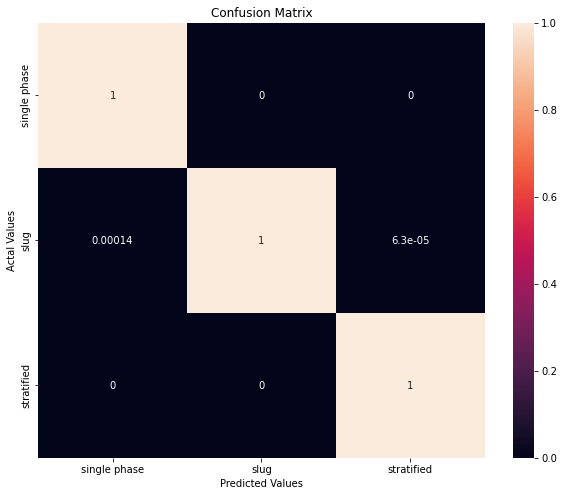

In [48]:
from sklearn.metrics import confusion_matrix

# Creating  a confusion matrix,which compares the y_test and y_pred
cm = confusion_matrix(y_test, rf_preds, normalize= 'true')

# Creating a dataframe for a array-formatted Confusion matrix,so it will be easy for plotting.
cm_df = pd.DataFrame(cm,
                     index = ['single phase','slug','stratified'], 
                     columns = ['single phase','slug','stratified'])

#Plotting the confusion matrix
plt.figure(figsize=(10,8))
sns.heatmap(cm_df, annot=True)
plt.title('Confusion Matrix')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()

The confusion matrix confirmed that by plotting the predicted values against the actual values, the model is not overfitting on the training dataset as TN and TP for the classes computed as 100%. As a result, this model can be used to predict the type of flows within wells or pipes within the oil industry with the greatest possible accuracy. Using these values, the oil industry can analyse the factors that have the greatest impact of flow types and take the necessary steps to mitigate or reduce detrimental flow types that could disrupt process operations.

Text(0.5, 0, 'Feature Importance')

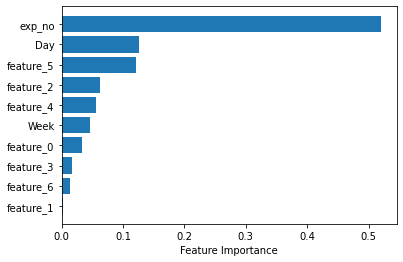

In [52]:
#Plot feature importance
sort = model_rf.feature_importances_.argsort()
plt.barh(X.columns[sort], model_rf.feature_importances_[sort])
plt.xlabel("Feature Importance")

Feature importance provides a summary of the feature variables that have a strong and weak connection with the prediction of the test variable. The above graph shows that 'Exp_no' which was the experiment number was the most important feature in predicting the target variable followed by Day and feature_5.